# Trabajo de CI - Entrenamiento del DETR (Detection Transformer)

## Introducción

En este Notebook se explicará como llevar a cabo el entrenamiento de un dataset de imágenes con el [DETR de Facebook](https://github.com/facebookresearch/detr), el cual combina dentro de su arquitectura y de una forma relativamente sencilla, las redes convolucionales y los transformers, logrando llevar a cabo tanto la detección como la segmentación de objetos. 

## Sobre el DETR

 ***Información general***

El DEtection TRansformer fue publicado el 27 de Mayo de 2020 a través del repositorio oficial de GitHub de FacebookResearch por Nicolas Carion y Francisco Massa. Además del código fuente, aquí se puede encontrar una serie de modelos pre-entrenados en el dataset COCO y Panoptic COCO, que alcanzan una precisión media del 42%, y los comandos básicos para poder entrenarlos y evaluarlos.


 ***La arquitectura***

La arquitectura del DETR está compuesta por 3 elementos esenciales: una red convolucional, un transformer (codificador y decodificador) y las capas finales para la predicción.



*   **Red convolucional (CNN)**: Este primer componente recibe una imagen de dimensiones $3$x$H_{0}$x$W_{0}$ de la que extrae un conjunto de características que redimensiona en un tensor de $2048$x$\frac{H_{0}}{32}$x$\frac{W_{0}}{32}$ (parámetros estándar utilizados, pueden ser modificados).

*   **Transformer codificador**: Antes de entrar al transformer, el tensor resultante de la CNN es aplanado hasta ser reducido a un vector. A este vector se le añade, al igual que en la arquitectura original del transformer, otro vector con la información posicional de las características (spatial positional encoding) para formar el conjunto de las claves (Keys, K). Dentro de cada capa del codificador se encuentra un módulo de atención propia que recibe las claves, colas (Queries, Q) y valores (Values, V) y una "feed-forward-network" (FFN).

*   **Transformer decodificador**: El decodicador recibe dos entradas distintas. Por un lado, unas colas de tamaño fijo *N* llamadas "colas de objetos" (object queries) que son las salidas de los anteriores decodificadores (originalmente con valor 0) y por otro la "atención" del codificador. En cada una de las capas del codificador se encuentra un módulo de atención propia, un bloque de atención codificador-decodificador y una FFN.

En la siguiente imagen se puede ver de manera más clara la estructura interna de ambas partes del transformer.

<figure>
<center>
<img src='https://miro.medium.com/max/750/1*fqxYqndHU4ijyt3Awe7orw.jpeg' alt="Estructura interna del transformer del DETR" width=550px/>
<figcaption>Estructura interna del transformer del DETR</figcaption></center>
</figure>

*   **Capas finales de predicción**: Finalmente, se utiliza una FFN con activación ReLU para obtener el resultado final de la detección. Esta FNN es alimentada por la salida del decodificador final del transformer, la cual tiene el mismo tamaño *N* que las colas de objetos que recibía cada decodificador. Cada uno de los elementos que se reciben corresponde con un posible objeto y, por lo tanto, con una clase y una caja de detección. Dado que *N* es un número fijo, es probable que el número de objetos en la imagen sea menor que *N*, si esto es así, aquellas predicciones sin objeto asignado reciben por clase el "no objeto".


La siguiente figura muestra un resumen de toda la arquitectura explicada.

<figure>
<center>
<img src='https://cdn.analyticsvidhya.com/wp-content/uploads/2020/05/Screenshot-from-2020-05-27-20-04-48.png' alt="Arquitectura del DETR" width=700px/>
<figcaption>Arquitectura del DETR</figcaption></center>
</figure>

## Preparación del dataset

Ahora, tras obtener una visión general del funcionamiento interno del DETR, el siguiente paso es obtener los "materiales" necesarios para poder utilizarlo. En este caso, se requiere un dataset de imágenes en formato COCO para entrenar la red.

El formato COCO sigue la siguiente estructura:

├ annotations/   
│  ├ annotations/custom_train.json   
│  └ annotations/custom_val.json   
├ train2017/   
└ val2017/

Donde ***annotations*** es un fichero que contiene dos archivos JSON (uno para el entrenamiento y otro para la validación) que recogen distinta información relacionada con las etiquetas del dataset, tal como el nombre y tamaño de cada imagen y las coordenadas absolutas de cada caja de detección en su interior (x_min, y_min, anchura, altura). ***Train2017*** es el fichero que contiene todas las imágenes de entrenamiento y ***val2017*** lo propio, pero con el conjunto de validación.

En este caso, el conjunto de datos utilizado pertenece un dataset público con temática de señales de tráfico y que cuenta con 4 tipos objetos distintos:

1.   *Prohibitory*
2.   *Danger*
3.   *Mandatory*
4.   *Other*

El dataset está disponible en formato YOLO en el siguiente [enlace](https://www.kaggle.com/valentynsichkar/traffic-signs-dataset-in-yolo-format) y, para su conversión a COCO se ha utilizado la herramienta web de [Roboflow](https://roboflow.com/), realizando una separación de 85% para el entrenamiento y 15% para la validación.

## Cambios en el repositorio original del DETR

En la fecha en la que se escribe este Notebook, el repositorio de GitHub del DETR no cuenta, de manera directa, con soporte para datasets externos a COCO o Panoptic COCO. Sin embargo, realizando las pequeñas modificaciones descritas a continuación este problema puede ser solventado.



*   main.py: Añadir un nuevo argumento para el número de clases.
*   models/detr.py: En el método ***build*** indicar que se use el número de clases indicado por parámetro añadido si el dataset utilizado no es ni COCO ni Panoptic COCO.
*   datasets/custom.py: Crear este nuevo fichero, tomando como referencia el método ***build*** de ***datasets/coco.py*** y adaptándolo para el manejo del dataset propio.
*   datasets/__init__.py: Añadir la llamada al método anterior si el dataset utilizado no es ni COCO ni Panoptic COCO.

## Comienzo de la práctica

En primer lugar se importarán los paquetes necesarios para el desarrollo de la práctica. Es importante que la versión instalada de PyTorch sea, al menos, la 1.5.

 **Nota: Este Notebook se ha ejecutado en Google Colaboratory, por lo que puede que su ejecución en otro entorno requiera la instalación adicional de paquetes.*

In [ ]:
!pip install torch torchvision

In [ ]:
import torch
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T
import json
import random
from pathlib import Path
import numpy as np
import pycocotools.coco as coco
from pycocotools.coco import COCO
import skimage.io as io
import pylab

In [ ]:
torch_version = torch.__version__
assert float(torch_version[:3]) >= 1.5
torch_version

'1.7.0+cu101'

#### Clonación del repositorio modificado 
A continuación, se clonará un repositorio que contenga los cambios anteriormente descritos. En este caso, he decidido aplicar los cambios manualmente en un repositorio personal.

In [ ]:
!git clone https://github.com/Serllira/detr

Cloning into 'detr'...
remote: Enumerating objects: 17, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 260 (delta 7), reused 12 (delta 4), pack-reused 243
Receiving objects: 100% (260/260), 12.86 MiB | 32.43 MiB/s, done.
Resolving deltas: 100% (134/134), done.


#### Descarga y manipulación de un modelo pre-entrenado
Para agilizar el entrenamiento, se realizará fine-tuning sobre uno de los modelos pr-entrenados que nos facilitan. Para ello, se debe eliminar la capa de clasificación del modelo descargado.

In [ ]:
%cd /content/detr/
!wget https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth
%ls

/content/detr
d2/         engine.py   main.py    requirements.txt      tox.ini
datasets/   hubconf.py  models/    run_with_submitit.py  util/
Dockerfile  LICENSE     README.md  test_all.py


In [ ]:
checkpoint = torch.load("detr-r50-e632da11.pth", map_location='cpu')
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]
torch.save(checkpoint,"detr-r50_custom.pth")

#### Carga y comprobación del dataset
Seguidamente, se descargará localmente el dataset deseado en formato COCO. En este caso, se ha realizado una copia de una carpeta personal de Drive, pero cualquier otro método es igualmente eficaz.

In [ ]:
from util.plot_utils import plot_logs

In [ ]:
%mkdir custom/

%cp -r /content/drive/MyDrive/Trabajo_CI_no_resize/annotations/ custom/
%cp -r /content/drive/MyDrive/Trabajo_CI_no_resize/train2017/ custom/
%cp -r /content/drive/MyDrive/Trabajo_CI_no_resize/val2017/ custom/

%ll custom/

total 80
drwx------ 2 root  4096 Feb  3 15:31 annotations/
drwx------ 2 root 61440 Feb  3 15:39 train2017/
drwx------ 2 root 12288 Feb  3 15:40 val2017/


El siguiente paso es comprobar si, tanto las imágenes como las etiquetas, pueden cargarse correctamente. Para ello, se hará uso de la API de COCO.

In [ ]:
%matplotlib inline
pylab.rcParams['figure.figsize'] = (10.0, 8.0)
dataDir='custom/'
dataType='train2017'
annFile='{}annotations/custom_train.json'.format(dataDir)

In [ ]:
coco=COCO(annFile)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


In [ ]:
cats = coco.loadCats(coco.getCatIds())

nms=[cat['name'] for cat in cats]
print('Categories: {}'.format(nms))

nms = set([cat['supercategory'] for cat in cats])
print('Super-categories: {}'.format(nms))

Categories: ['Traffic-signs', 'danger', 'mandatory', 'other', 'prohibitory']
Super-categories: {'Traffic-signs', 'none'}


In [ ]:
catIds = coco.getCatIds(catNms=['danger']);
imgIds = coco.getImgIds(catIds=catIds );

Image n°15
Image name: custom//train2017/00408_jpg.rf.61efa54e2bd0f214b95b4faba2c26953.jpg


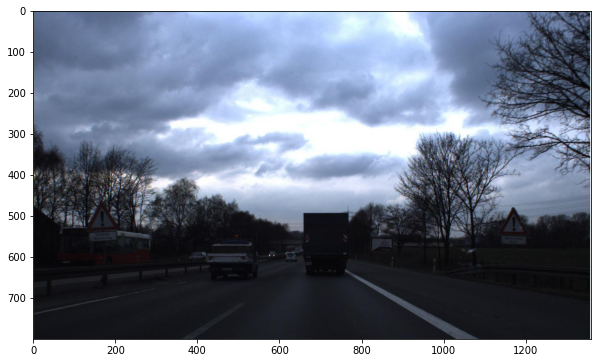

In [ ]:
img_id = imgIds[np.random.randint(0,len(imgIds))]
print('Image n°{}'.format(img_id))

img = coco.loadImgs(img_id)[0]

img_name = '%s/%s/%s'%(dataDir, dataType, img['file_name'])
print('Image name: {}'.format(img_name))

I = io.imread(img_name)
plt.figure()
plt.imshow(I)

Al poder visualziar la imagen superior, se afirma que se puede acceder a las imágenes de manera adecuada.

In [ ]:
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds)
anns = coco.loadAnns(annIds)

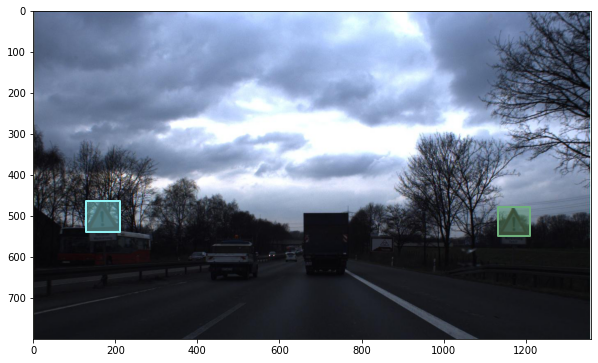

In [ ]:
plt.imshow(I)
coco.showAnns(anns, draw_bbox=True)

De manera similar,la presencia de las cajas de detección en la imagen superior indica que también se puede hacer uso de las etiquetas sin ningún inconveniente.

#### Inicio del entrenamiento
En este punto ya se dispone del dataset bien estructurado, del modelo adaptado para su entrenamiento y el código del DETR modificado, por lo que todo está preparado para poder entrenar.

Al script principal será necesario pasarle, de manera obligatoria, los siguientes parámetros:

*   ***--dataset_file***: El nombre del fichero del dataset.
*   ***--coco_file***: La ruta del fichero donde se encuentra el dataset.
*   ***--resume***: Checkpoint sobre el que retomar el entrenamiento.
*   ***--num_classes***: Parámetros añadido en el código modificado que recibe el número de clases + 1 (debido a que se debe incluir la clase *no objeto*).

Y de manera opcional, se le puede añadir:

*   ***--output_dir***: Directorio donde se guardarán los checkpoints del entramiento, así como los archivos de log.
*   ***--epochs***: Número de épocas de entrenamiento. Por defecto son 300 épocas.

In [ ]:
!python main.py \
  --dataset_file "custom" \
  --coco_path "/content/detr/custom" \
  --output_dir "logdirs" \
  --resume "/content/detr/detr-r50_custom.pth" \
  --num_classes 5 \
  --epochs 200

Se han truncado las últimas 5000 líneas del flujo de salida.
Epoch: [115]  [160/314]  eta: 0:01:04  lr: 0.000100  class_error: 0.00  loss: 4.4957 (5.0753)  loss_ce: 0.0540 (0.1294)  loss_bbox: 0.0662 (0.0777)  loss_giou: 0.5428 (0.6170)  loss_ce_0: 0.2075 (0.2354)  loss_bbox_0: 0.0683 (0.0768)  loss_giou_0: 0.5244 (0.5863)  loss_ce_1: 0.1198 (0.1748)  loss_bbox_1: 0.0547 (0.0752)  loss_giou_1: 0.4491 (0.5967)  loss_ce_2: 0.0510 (0.1315)  loss_bbox_2: 0.0712 (0.0791)  loss_giou_2: 0.5431 (0.6332)  loss_ce_3: 0.0301 (0.1263)  loss_bbox_3: 0.0730 (0.0806)  loss_giou_3: 0.5433 (0.6345)  loss_ce_4: 0.0364 (0.1253)  loss_bbox_4: 0.0666 (0.0772)  loss_giou_4: 0.5439 (0.6184)  loss_ce_unscaled: 0.0540 (0.1294)  class_error_unscaled: 0.0000 (19.4321)  loss_bbox_unscaled: 0.0132 (0.0155)  loss_giou_unscaled: 0.2714 (0.3085)  cardinality_error_unscaled: 0.0000 (0.6460)  loss_ce_0_unscaled: 0.2075 (0.2354)  loss_bbox_0_unscaled: 0.0137 (0.0154)  loss_giou_0_unscaled: 0.2622 (0.2932)  cardinality_e

#### Métricas del entrenamiento
Una vez finalizado el entrenamiento, el repositorio del DETR cuenta con una utilidad que analiza el fichero de *log* y muestra gráficamente el progreso de las distintas métricas capturadas a lo largo de este. A continuación, se muestran algunas de las más comunes.

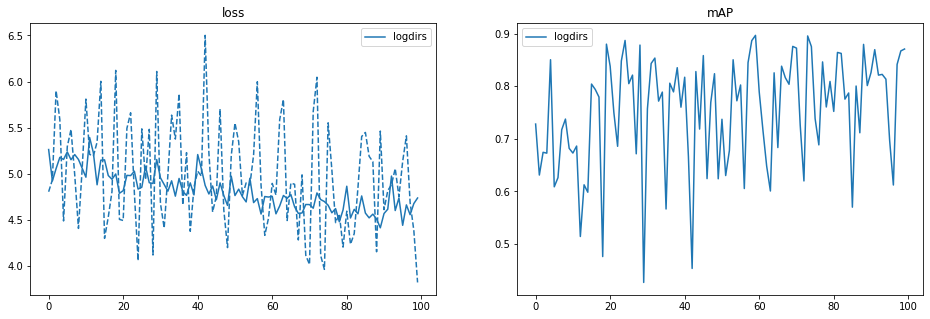

In [ ]:
log_directory = [Path('logdirs/')]

fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

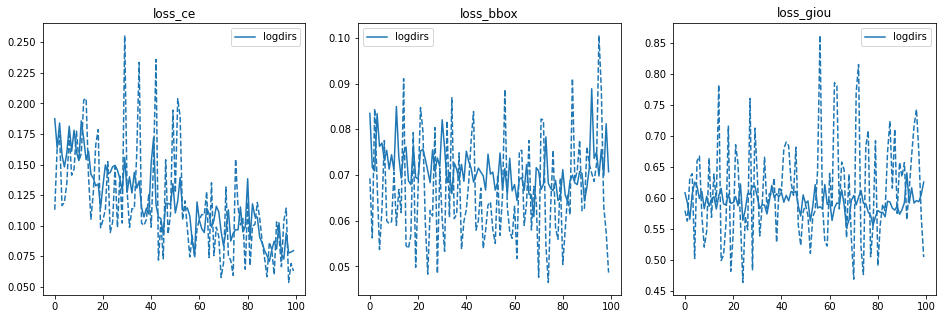

In [ ]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

#### Inferencia del modelo entrenado
Finalmente, se comprobará que el modelo entrenado es capaz de predecir exitosamente los objetos para los que ha sido entrenados.

In [ ]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=5)

checkpoint = torch.load('logdirs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval();

Downloading: "https://github.com/facebookresearch/detr/archive/master.zip" to /root/.cache/torch/hub/master.zip


In [ ]:
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

finetuned_classes = [
      'N/A', 'danger', 'mandatory', 'other', 'prohibitory'
  ]

transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [ ]:
def filter_bboxes_from_outputs(outputs, threshold):
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold
  probas_to_keep = probas[keep]
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)

  return probas_to_keep, bboxes_scaled

In [ ]:
def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [ ]:
def run_worflow(my_image, my_model):
  img = transform(my_image).unsqueeze(0)
  outputs = my_model(img)
  for threshold in [1, 0.7]:
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)
    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)

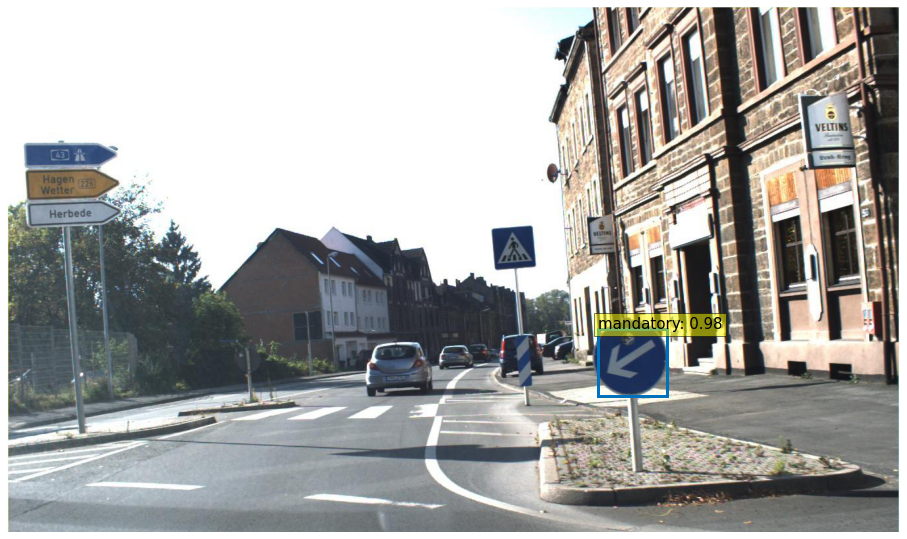

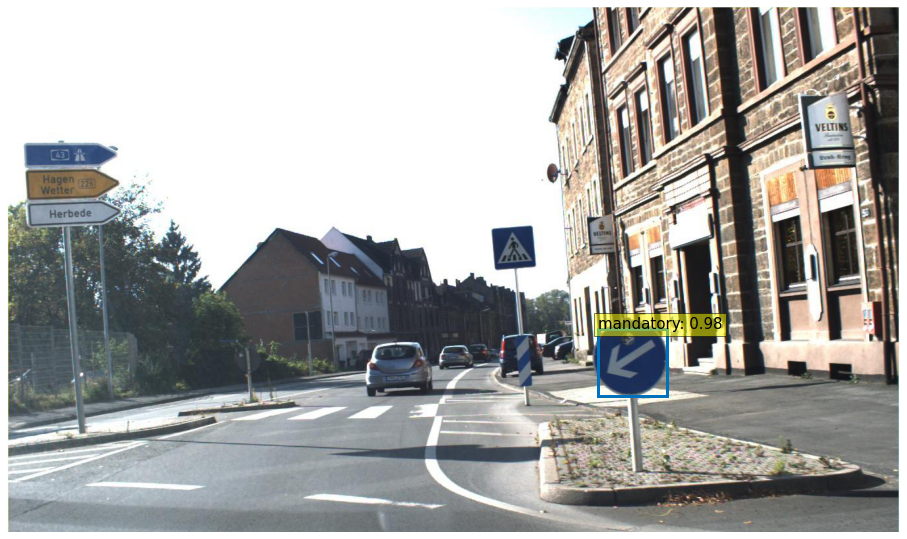

In [ ]:
from PIL import Image
img_name = '/content/detr/custom/train2017/00002_jpg.rf.fc0ab87e1673b78ce2da5e1ba0846dbc.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

La imagen superior forma parte del conjunto del entrenamiento, por lo que es normal que tenga un alto porcentaje de acierto. Para realmente ponerlo a prueba, se utilizá una imagen que el modelo no haya "visto" nunca.

In [ ]:
!wget https://nextcity.org/images/made/7762611728_c19653d8fd_k_920_613_80.jpg -O test_image.jpg

--2021-02-03 19:53:23--  https://nextcity.org/images/made/7762611728_c19653d8fd_k_920_613_80.jpg
Resolving nextcity.org (nextcity.org)... 104.26.6.162, 104.26.7.162, 172.67.69.90, ...
Connecting to nextcity.org (nextcity.org)|104.26.6.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 140356 (137K) [image/jpeg]
Saving to: ‘test_image.jpg’

test_image.jpg      100%[===================>] 137.07K  --.-KB/s    in 0.01s   

2021-02-03 19:53:23 (9.41 MB/s) - ‘test_image.jpg’ saved [140356/140356]



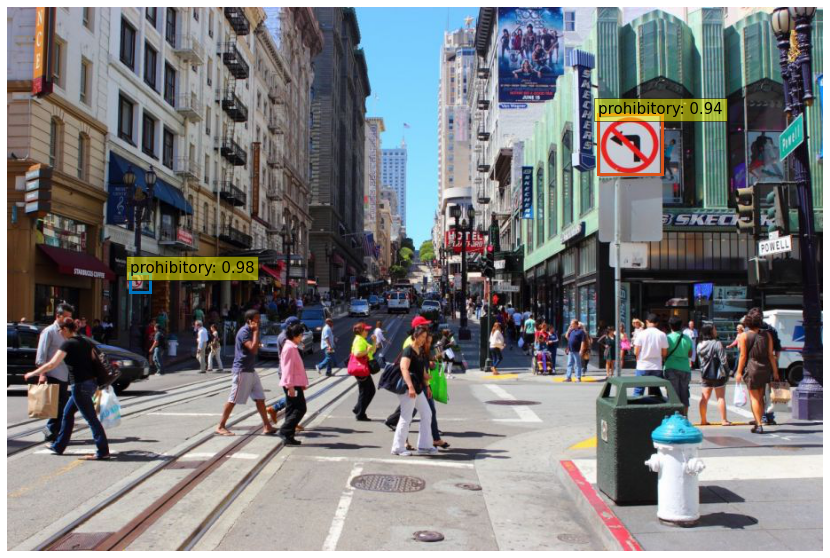

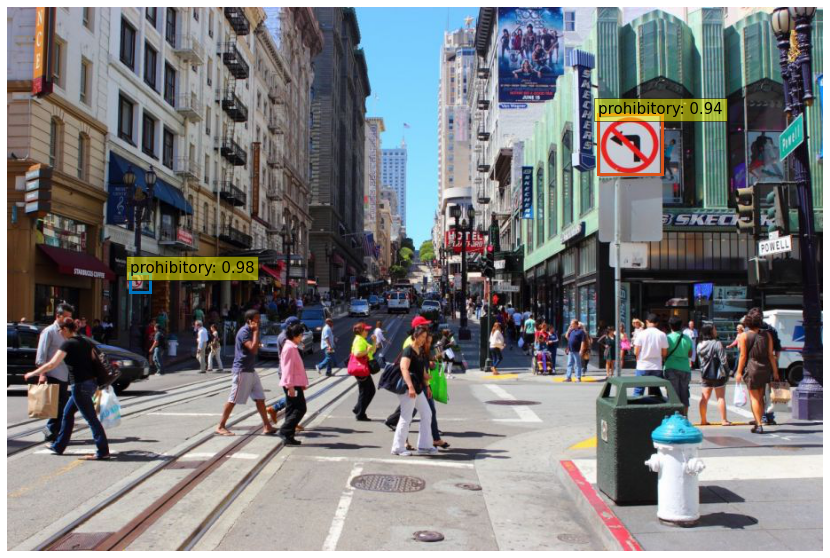

In [ ]:
img_name = '/content/detr/test_image.jpg'
im = Image.open(img_name)

run_worflow(im,
            model)

Aquí el modelo entrenado vuelve a ser capaz de detectar los objetos de la imagen, por lo que se puede concluir que el resultado ha sido exitoso.

## Trabajo futuro
A pesar de lo anterior, aún quedan diversos frentes por explorar que permitan mejorar la precisión del modelo entrenado. Seguidamente se exponen algunas ideas que podrían llegar a este fin:

***Mejorar aplicables al dataset***: El dataset utilizado es relativamente pequeño (740 imágenes), por lo que la inclusión de más imágenes variadas podría inducir a una mayor riqueza en las predicciones de la red. De igual modo, las técnicas de *data augmentation* podrían ayudar a mejorar aún más estas salidas.

***Ajuste de los hiperparámetros del modelo***: Aunque en esta práctica no se hayan cambiado, la arquitectura del DETR cuenta con diversos hiperparámetros que pueden ser modificados. Entre ellos se encuentran algunos como la CNN utilizada, el tamaño de las capas de las FFN, el ratio de aprendizaje, el número de capas del codificador y decodicador, etc. Respecto a este último, el paper original muestra una tabla comparando como varía la complejidad de la red y su precisión media con diversas combinaciones de este parámetro, por lo que, sin duda, el hecho de "jugar" con ellos puede ser un factor altamente influyente.

<figure>
<center>
<img src='https://i.ibb.co/ggTbfzy/effect-of-encoder-size-DETR.png' alt="Efecto del aumento de capas en el codificador" width=550px/>
<figcaption>Efecto del aumento de capas en el codificador</figcaption></center>
</figure>



